In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lasio as ls
import tkinter as tk
from tkinter import filedialog
import welly
import welly.quality as wq

# Wireline log data 

In [4]:
#the data from the wire line log (the las file)

# the file No.1 : Gorgonichthys_1_suite3_supercombo_log.las ( put the file path according to your pc)
file_path1 =r"D:\Case study\Gorgonichthys_1_suite3_supercombo_log.las"

# the file No.2 : Gorgonichthys1_suite2_CMR_NUC_MAINLOG.las ( put the file path according to your pc)
file_path2 =r"D:\Case study\Gorgonichthys1_suite2_CMR_NUC_MAINLOG.las"

# the file No.3 : gorgonichthys_1_wire_public_2010_sdb.las ( put the file path according to your pc)
file_path3 =r"D:\Case study\gorgonichthys_1_wire_public_2010_sdb.las"

#las file reading using lasio library
las1 = ls.read(file_path1)
las2 = ls.read(file_path2)
las3 = ls.read(file_path3)

#creating pandas data frame of las file (Using lasio.read(file_path1).df())
#df1 (Gorgonichthys_1_suite3_supercombo_log) 
#df2 (Gorgonichthys1_suite2_CMR_NUC_MAINLOG)
#df3 (gorgonichthys_1_wire_public_2010_sdb)

df1 = las1.df()
df1 = df1.reset_index()

df2 = las2.df()
df2 = df2.reset_index()

df3 = las3.df()
df3 = df3.reset_index()

#Getting the curve information: 1. Depth range of the wire line log 
#                               2. Mnemonic  Unit  Value  Description
#                               3. curves stastics


# CUVRE INFOMATION
print('df1 Depth range : ')
start_depth1 = str(las1["DEPTH"][-1])
end_depth1 = str(las1["DEPTH"][0])
print(start_depth1 + ' to ' + end_depth1)
print('----------------------------------------------------------------------------------')
print('df1 curves information')
print('----------------------------------------------------------------------------------')
print(las1.curves)
print('----------------------------------------------------------------------------------')
print('df1 curves stastics')
print('----------------------------------------------------------------------------------')
print(las1.df().describe())
print('----------------------------------------------------------------------------------')


 # CUVRE INFOMATION
print('df2 Depth range : ')
start_depth2 = str(las2["DEPTH"][-1])
end_depth2 = str(las2["DEPTH"][0])
print(start_depth2 + ' to ' + end_depth2)
print('----------------------------------------------------------------------------------')
print('df2 curves information')
print('----------------------------------------------------------------------------------')
print(las2.curves)
print('----------------------------------------------------------------------------------')
print('df2 curves stastics')
print('----------------------------------------------------------------------------------')
print(las2.df().describe())
print('----------------------------------------------------------------------------------')

 # CUVRE INFOMATION
print('df3 Depth range : ')
start_depth3 = str(las3["DEPTH"][-1])
end_depth3 = str(las3["DEPTH"][0])
print(start_depth3 + ' to ' + end_depth3)
print('----------------------------------------------------------------------------------')
print('df3 curves information')
print('----------------------------------------------------------------------------------')
print(las3.curves)
print('----------------------------------------------------------------------------------')
print('df3 curves stastics')
print('----------------------------------------------------------------------------------')
print(las3.df().describe())
print('----------------------------------------------------------------------------------')


Only engine='normal' can read wrapped files


df1 Depth range : 
3909.06 to 4775.7588
----------------------------------------------------------------------------------
df1 curves information
----------------------------------------------------------------------------------
Mnemonic  Unit  Value  Description                               
--------  ----  -----  -----------                               
DEPTH     M            DEPTH (BOREHOLE)                          
AT10      OHMM         Array Induction Two Foot Resistivity A10  
AT20      OHMM         Array Induction Two Foot Resistivity A20  
AT30      OHMM         Array Induction Two Foot Resistivity A30  
AT60      OHMM         Array Induction Two Foot Resistivity A60  
AT90      OHMM         Array Induction Two Foot Resistivity A90  
CALI      IN           Caliper                                   
DRHO      G/C3         Bulk Density Correction                   
DT2       US/F         Delta-T Shear - Upper Dipole              
DTCO      US/F         Delta-T Compressional 

A quick look on the data from plotting them

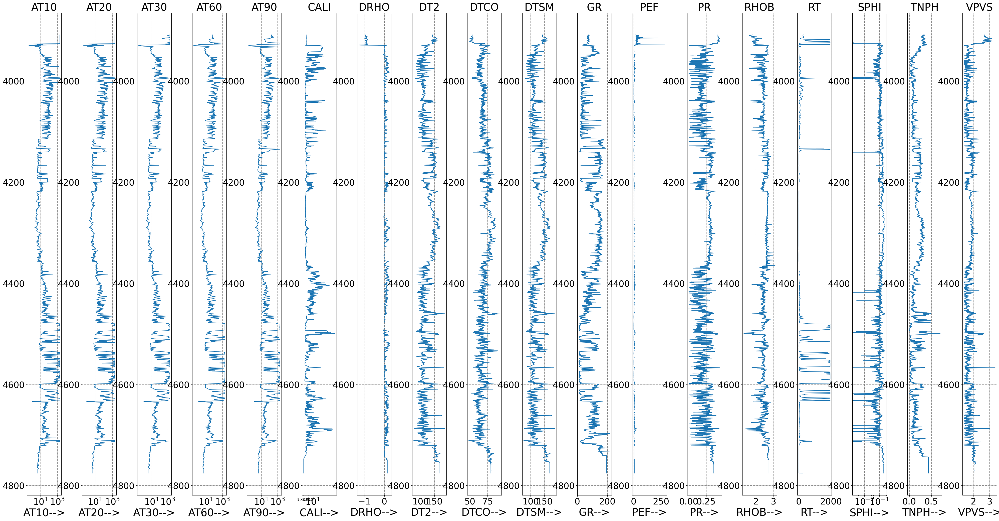

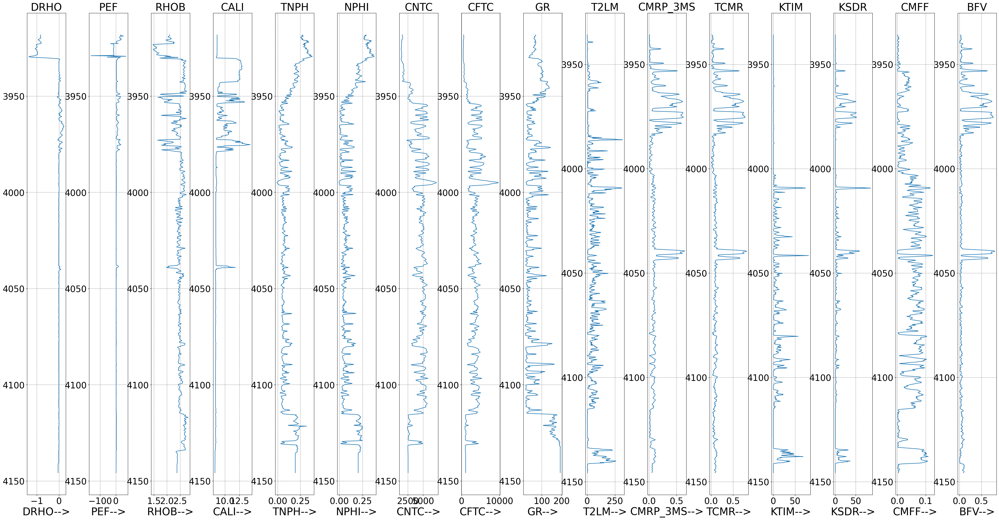

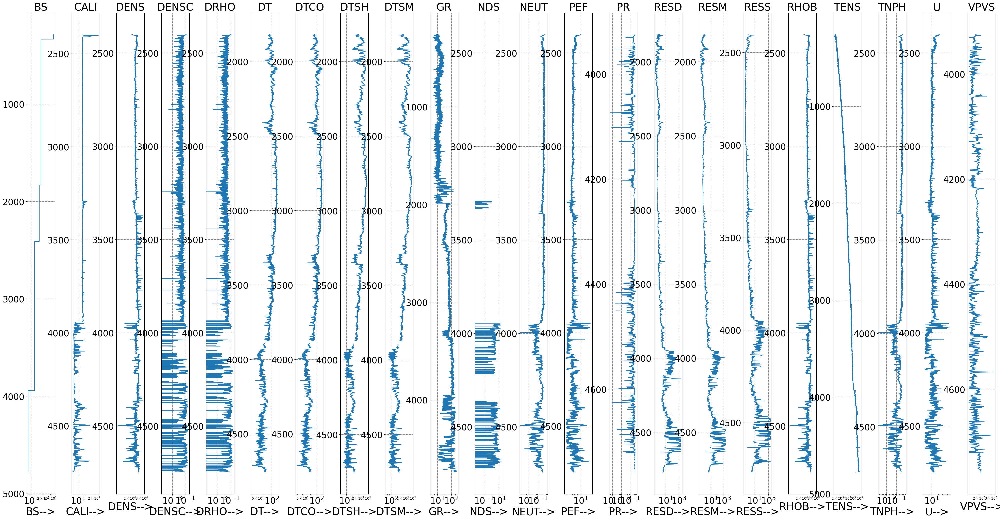

In [5]:
# Plotting the data for the overview of the data 

#file No.1 
k = len(df1.columns) - 1 #Number of the curve to be plotted 
fig, axs = plt.subplots(1, k, figsize=(50, 25)) #creating the figure 

for i in range(k):
    if  i>5 and i!=15: #simple plots with normal scale to plot remaining is resistivity plot that will be using semilog axis
        axs[i].plot(df1.iloc[:, i+1], df1.iloc[:, 0])
        axs[i].invert_yaxis()#setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df1.columns[i+1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df1.columns[i+1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
    else:
        axs[i].plot(df1.iloc[:, i+1], df1.iloc[:, 0])
        axs[i].semilogx()#for the the resistivit data 
        axs[i].invert_yaxis()#setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df1.columns[i+1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df1.columns[i+1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')

plt.subplots_adjust(wspace=0.6)
plt.show()


#file No.2
k = len(df2.columns) - 1#Number of the curve to be plotted 
fig, axs = plt.subplots(1, k, figsize=(50, 25))#creating the figure 

for i in range(k):
        axs[i].plot(df2.iloc[:, i+1], df2.iloc[:, 0])
        axs[i].invert_yaxis()#setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df2.columns[i+1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df2.columns[i+1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')

plt.subplots_adjust(wspace=0.6)
plt.show()

#file No. 3
k = len(df3.columns) - 1
fig, axs = plt.subplots(1, k, figsize=(50, 25))

for i in range(k):
    if i <=14 and i >17:#simple plots with normal scale to plot remaining is resistivity plot that will be using semilog axis
        axs[i].plot(df3.iloc[:, i+1], df3.iloc[:, 0])
        axs[i].invert_yaxis()#setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df3.columns[i+1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df3.columns[i+1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
    else:
        axs[i].plot(df3.iloc[:, i+1], df3.iloc[:, 0])
        axs[i].semilogx()
        axs[i].invert_yaxis()#setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df3.columns[i+1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df3.columns[i+1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')

plt.subplots_adjust(wspace=0.6)
plt.show()

the upper vul 3911.5=<depth<= 4218

In [8]:
#Creating the data frame according ot the depth range of the upper vulcan formation 
df1uv = df1[df1['DEPTH'] >=3911.5 ][df1['DEPTH'] <= 4218] # file No.1 
df2uv = df2[df2['DEPTH'] >=3911.5 ][df2['DEPTH'] <= 4218] # file No.2
df3uv = df3[df3['DEPTH'] >=3911.5 ][df3['DEPTH'] <= 4218] # file No.3

C:\Users\Ritesh\AppData\Local\Temp\ipykernel_3288\1833508945.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df1uv = df1[df1['DEPTH'] >=3911.5 ][df1['DEPTH'] <= 4218] # file No.1
C:\Users\Ritesh\AppData\Local\Temp\ipykernel_3288\1833508945.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df3uv = df3[df3['DEPTH'] >=3911.5 ][df3['DEPTH'] <= 4218] # file No.3


# QC of the wire line data for upper vulcan formation

1.plotting the data in upper vulcan formation 

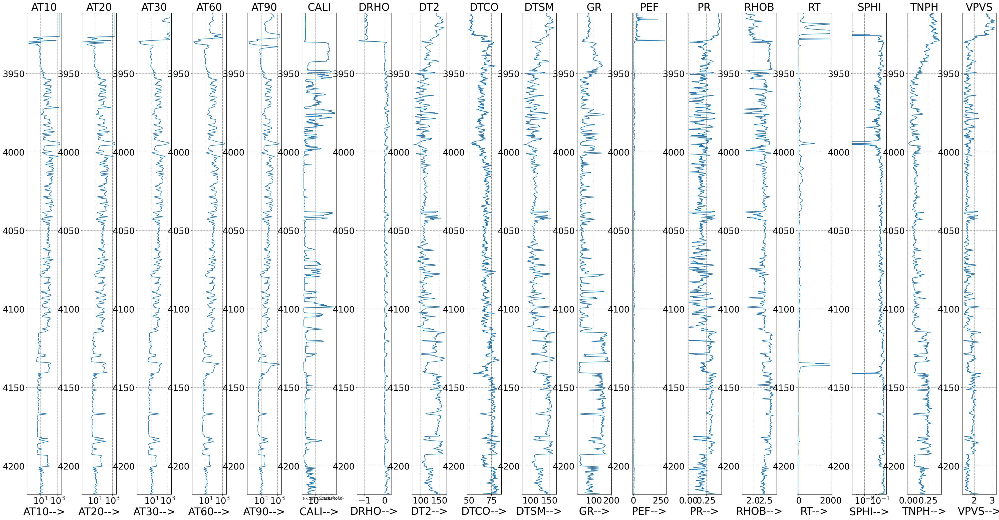

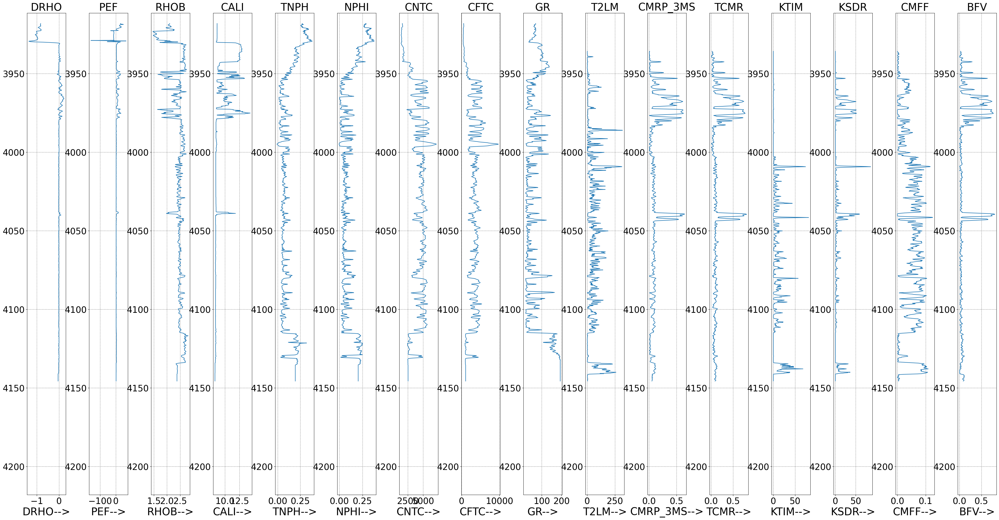

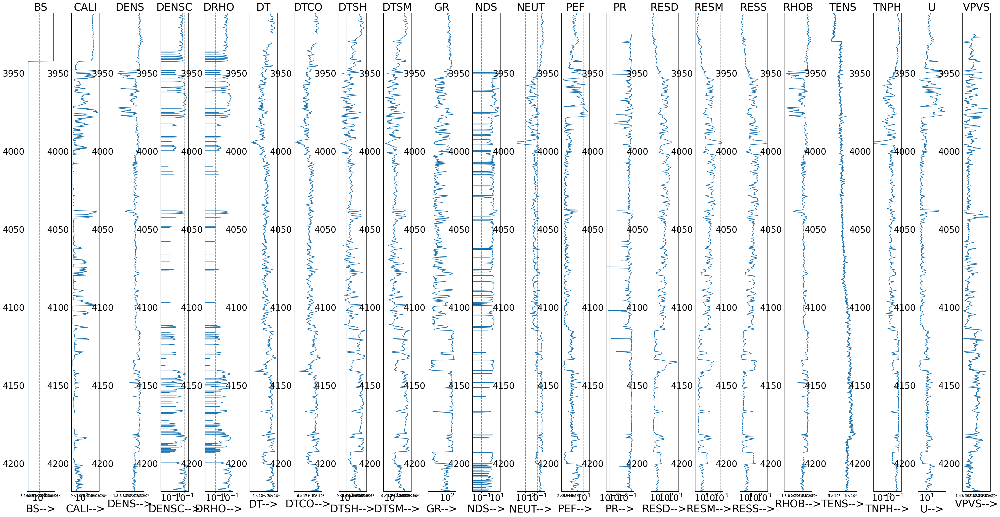

In [15]:
#minimum value of the depth value
min_value=3911.5 #in  meters
#maximum value of the depth value 
max_value=4218 #in meters


# File No.1
k = len(df1uv.columns) - 1  # Number of the curve to be plotted
fig, axs = plt.subplots(1, k, figsize=(50, 25))  # Creating the figure

for i in range(k):
    if i > 5 and i != 15:  # Simple plots with normal scale to plot remaining is resistivity plot that will be using semilog axis
        axs[i].plot(df1uv.iloc[:, i + 1], df1uv.iloc[:, 0])
        axs[i].invert_yaxis()  # Setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df1uv.columns[i + 1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df1uv.columns[i + 1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
        axs[i].set_ylim(max_value,min_value)
    else:
        axs[i].plot(df1uv.iloc[:, i + 1], df1uv.iloc[:, 0])
        axs[i].semilogx()  # For the resistivity data
        axs[i].invert_yaxis()  # Setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df1uv.columns[i + 1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df1uv.columns[i + 1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
        axs[i].set_ylim(max_value,min_value)
plt.subplots_adjust(wspace=0.6)
plt.show()

# File No.2
k = len(df2uv.columns) - 1  # Number of the curve to be plotted
fig, axs = plt.subplots(1, k, figsize=(50, 25))  # Creating the figure

for i in range(k):
    axs[i].plot(df2uv.iloc[:, i + 1], df2uv.iloc[:, 0])
    axs[i].invert_yaxis()  # Setting the depth to reverse
    axs[i].tick_params(axis='both', which='major', labelsize=25)
    axs[i].xaxis.set_label_position('bottom')
    axs[i].set_xlabel(f'{df2uv.columns[i + 1]}-->', fontsize=30)
    axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
    axs[i].set_title(df2uv.columns[i + 1], fontsize=30)
    axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
    axs[i].set_ylim(max_value,min_value)

plt.subplots_adjust(wspace=0.6)
plt.show()

# File No. 3
k = len(df3uv.columns) - 1
fig, axs = plt.subplots(1, k, figsize=(50, 25))

for i in range(k):
    if i <= 14 and i > 17:  # Simple plots with normal scale to plot remaining is resistivity plot that will be using semilog axis
        axs[i].plot(df3uv.iloc[:, i + 1], df3uv.iloc[:, 0])
        axs[i].invert_yaxis()  # Setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df3uv.columns[i + 1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df3uv.columns[i + 1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
        axs[i].set_ylim(max_value,min_value)
    else:
        axs[i].plot(df3uv.iloc[:, i + 1], df3uv.iloc[:, 0])
        axs[i].semilogx()
        axs[i].invert_yaxis()  # Setting the depth to reverse
        axs[i].tick_params(axis='both', which='major', labelsize=25)
        axs[i].xaxis.set_label_position('bottom')
        axs[i].set_xlabel(f'{df3uv.columns[i + 1]}-->', fontsize=30)
        axs[i].set_ylabel('<--DEPTH', fontsize=30, visible=False)
        axs[i].set_title(df3uv.columns[i + 1], fontsize=30)
        axs[i].grid(which='major', axis='both', linestyle='--', color='gray')
        axs[i].set_ylim(max_value,min_value)

plt.subplots_adjust(wspace=0.6)
plt.show()


2.checking the missing value in the data 

In [9]:
# Check for missing values
print(df1uv.isnull().sum(),df2uv.isnull().sum(),df3uv.isnull().sum())

DEPTH     0
AT10      0
AT20      0
AT30      0
AT60      0
AT90      0
CALI      0
DRHO      0
DT2       0
DTCO      0
DTSM      0
GR        0
PEF       0
PR       22
RHOB      0
RT        0
SPHI      0
TNPH      0
VPVS     22
dtype: int64 DEPTH         0
DRHO          0
PEF           0
RHOB          0
CALI          0
TNPH          0
NPHI          0
CNTC          0
CFTC          0
GR            0
T2LM        116
CMRP_3MS    116
TCMR        116
KTIM        116
KSDR        116
CMFF        116
BFV         116
dtype: int64 DEPTH      0
BS         0
CALI       0
DENS       0
DENSC      0
DRHO       0
DT        39
DTCO      39
DTSH       0
DTSM       0
GR         0
NDS        0
NEUT       0
PEF        0
PR       140
RESD       0
RESM       0
RESS       0
RHOB       0
TENS       0
TNPH       0
U          0
VPVS     140
dtype: int64


<Axes: >

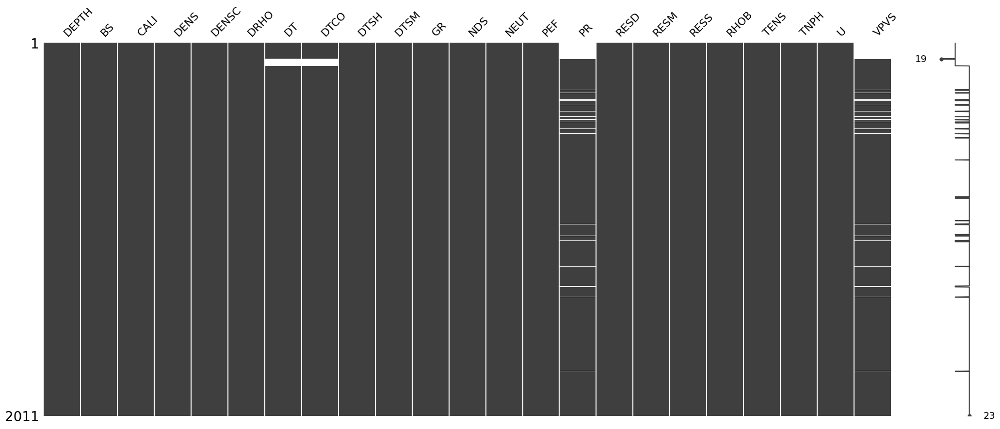

In [10]:
import missingno as msno
msno.matrix(df3uv)

Observation: Missing values are present in the DataFrame, but they do not affect the wireline logs required for the calculations in the case study. Furthermore, the majority of wireline log data is available in the "df3uv" DataFrame, specifically in the file "gorgonichthys_1_wire_public_2010_sdb.las" (#03 file). Therefore, we will primarily use this dataset for our analysis.

--------------------------------------------------------------------------------------------------------------------------------

3.Checking for the bad bore hole condition 

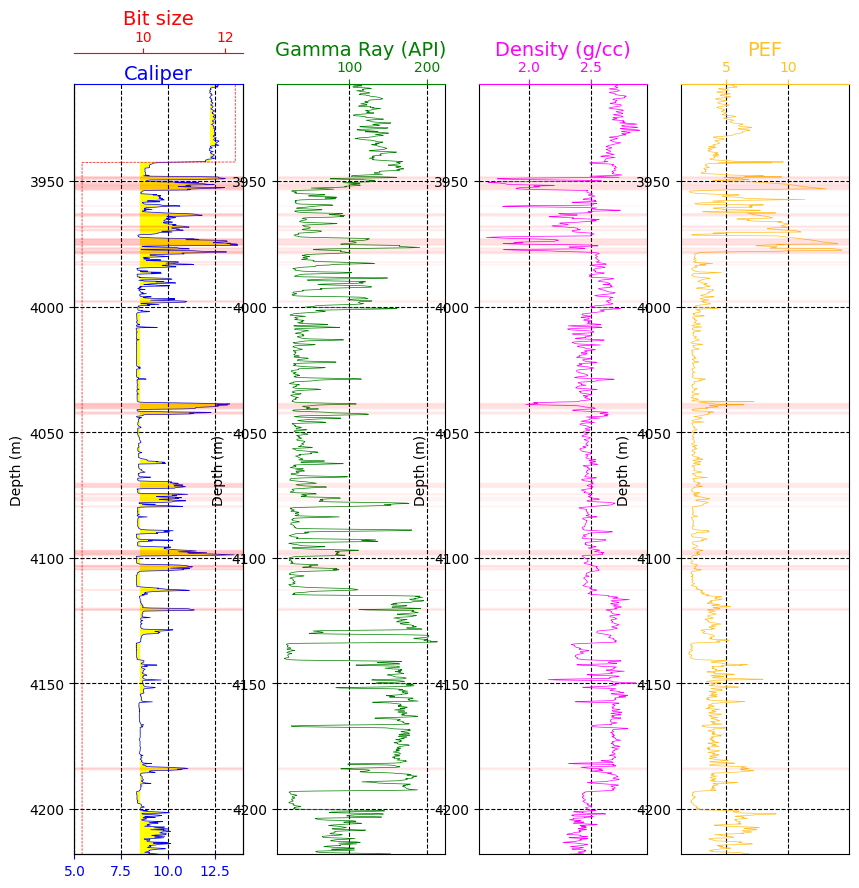

In [18]:

tol_val=2 #tolerence value fot the bit size and caliper difference

fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((1, 4), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 4), (0, 1), rowspan=1, colspan=1)
ax3 = plt.subplot2grid((1, 4), (0, 2), rowspan=1, colspan=1)
ax4 = plt.subplot2grid((1, 4), (0, 3),rowspan=1, colspan=1)

ax1.plot(df3uv.CALI, df3uv.DEPTH, lw=0.5, color='blue')
ax1.fill_betweenx(df3uv.DEPTH, df3uv.BS, df3uv.CALI, facecolor='yellow')
ax1.set_xlabel('Caliper (inches)')
ax1.set_ylabel('Depth (m)')
ax1.set_ylim(max_value, min_value) # Reversed the y-axis limits
ax1.set_xlim(5,14)
ax1.tick_params(axis='x', colors='b')
ax1.spines['top'].set_edgecolor('b')
ax1.spines['top'].set_position(("axes", 1.0))
ax1.xaxis.set_ticks_position('top')
ax1.set_xlabel('Caliper',color='b', fontsize=14)
ax1.xaxis.set_label_position('top')
ax1.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

ax11=ax1.twiny()

ax11.plot(df3uv.BS, df3uv.DEPTH, lw=0.5, color='red', linestyle='dashed')
#ax11.set_xlim(5,14)
ax11.tick_params(axis='x', colors='r')
ax11.spines['top'].set_edgecolor('r')
ax11.spines['top'].set_position(("axes", 1.04))
ax11.set_xlabel('Bit size',color='r',fontsize=14)
ax11.xaxis.set_label_position('top')
ax1.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

ax2.plot(df3uv.GR, df3uv.DEPTH, lw=0.5, color='green')
ax2.set_ylabel('Depth (m)')
#ax2.set_xlim(0, 200)
ax2.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax2.tick_params(axis='x', colors='g')
ax2.spines['top'].set_edgecolor('g')
ax2.spines['top'].set_position(("axes", 1.0))
ax2.xaxis.set_ticks_position('top')
ax2.set_xlabel('Gamma Ray (API)',color='g', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


ax3.plot(df3uv.RHOB, df3uv.DEPTH, lw=0.5, color='magenta')
ax3.set_ylabel('Depth (m)')
#ax3.set_xlim(1.95, 2.95)
ax3.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax3.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)
ax3.tick_params(axis='x', colors='magenta')
ax3.spines['top'].set_edgecolor('magenta')
ax3.spines['top'].set_position(("axes", 1.0))
ax3.xaxis.set_ticks_position('top')
ax3.set_xlabel('Density (g/cc)',color='magenta', fontsize=14)
ax3.xaxis.set_label_position('top')
ax3.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

ax4.plot(df3uv.PEF, df3uv.DEPTH, lw=0.5, color='#FFC125')
ax4.set_ylabel('Depth (m)')
ax4.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax4.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)
ax4.tick_params(axis='x', colors='#FFC125')
ax4.spines['top'].set_edgecolor('#FFC125')
ax4.spines['top'].set_position(("axes", 1.0))
ax4.xaxis.set_ticks_position('top')
ax4.set_xlabel('PEF',color='#FFC125', fontsize=14)
ax4.xaxis.set_label_position('top')
ax4.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


# Check the condition and plot horizontal lines
condition = abs(df3uv.BS - df3uv.CALI) > tol_val
for depth1, is_condition_met in zip(df3uv.DEPTH, condition):
    if is_condition_met:
        ax1.axhline(y=depth1, color='red', alpha=0.025)
        ax1.axhline(y=depth1, color='red', alpha=0.025)
        ax2.axhline(y=depth1, color='red', alpha=0.024)
        ax3.axhline(y=depth1, color='red', alpha=0.025)
        ax4.axhline(y=depth1, color='red', alpha=0.025)
df3uv_bad=df3uv[condition]


plt.show()


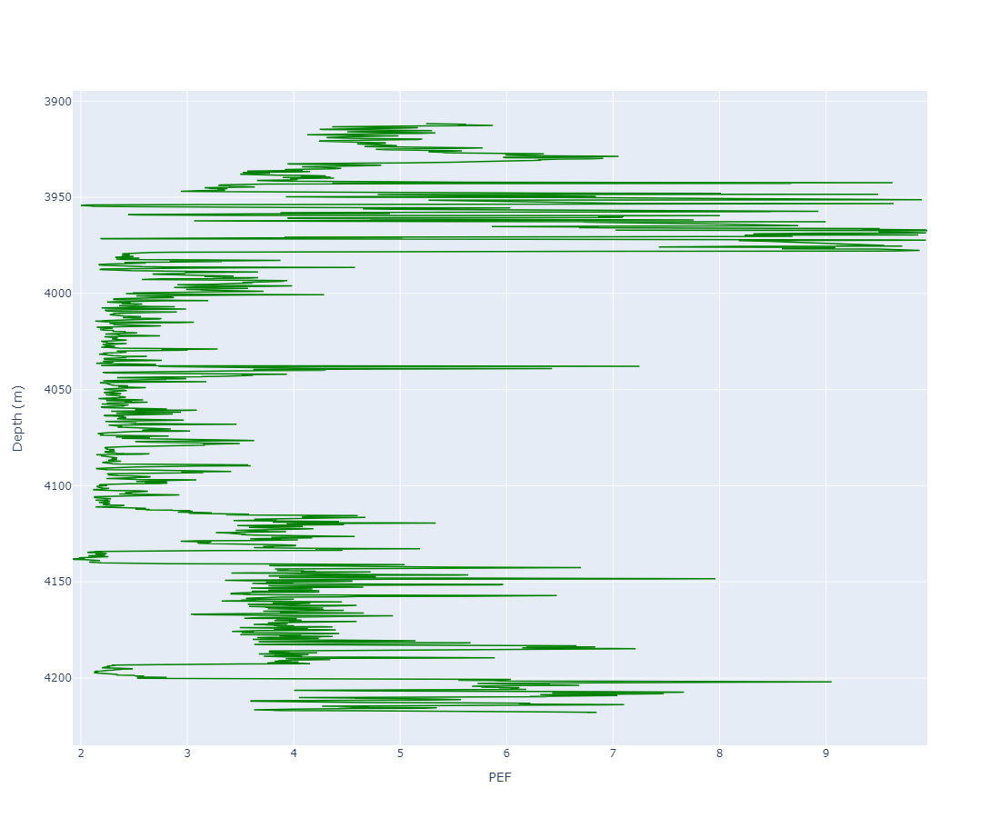

In [19]:
# Name of the columns
col = 'PEF'
# Window size
upper_cutoff = 10
lower_cutoff = 0

window = 50
# Create a mask for the outliers
outlier_mask = (df3uv[col] < lower_cutoff) | (df3uv[col] > upper_cutoff)
# Calculate the rolling mean with the specified window size
rolling_mean = df3uv[col].rolling(window=window, min_periods=1).mean()
# Replace values outside the cutoff with the rolling mean
df3uv.loc[outlier_mask, col] = rolling_mean[outlier_mask]

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
 
fig = make_subplots(rows=1, cols=1, shared_yaxes=True, horizontal_spacing=0.03)
fig.add_trace(go.Scatter(x=df3uv[col], y=df3uv['DEPTH'], line=dict(width=1.5, color='green'), name=col), row=1, col=1)
fig.update_xaxes(title_text=col, row=1, col=1)
fig.update_yaxes(title_text='Depth (m)', autorange='reversed', gridwidth=0.8)
fig.update_layout(width=400, height=900)  # Adjust width and height as needed
fig.show()


Observation: In the depth range around 3950 meters to 4000 meters, the borehole exhibits poor or ill-conditioned measurements. Similarly, in the vicinity of 4100 meters and within the interval from 4050 to 4100 meters and for depth greater than 4200, the data shows characteristics of a challenging borehole condition. These conditions may result in inaccuracies in wireline log measurements, potentially leading to issues during data analysis, such as the misinterpretation of geological formations or the introduction of outliers so we have to be careful about these depth ranges. It's essential to note that the data values in this lower region significantly differ from those in the upper section.

# Core data 

Column names: ['Well', 'Basin', 'Field', 'Top depth (m)', 'Base depth (m)', 'Porosity (%)', 'Porosity method', 'Permeability (mD)', 'Permeability method', 'Bulk density (g/cc)', 'Core number', 'Grain density (g/cc)', 'Nob pressure (Kpa)', 'Sample Id', 'Analysis method', 'Remarks']


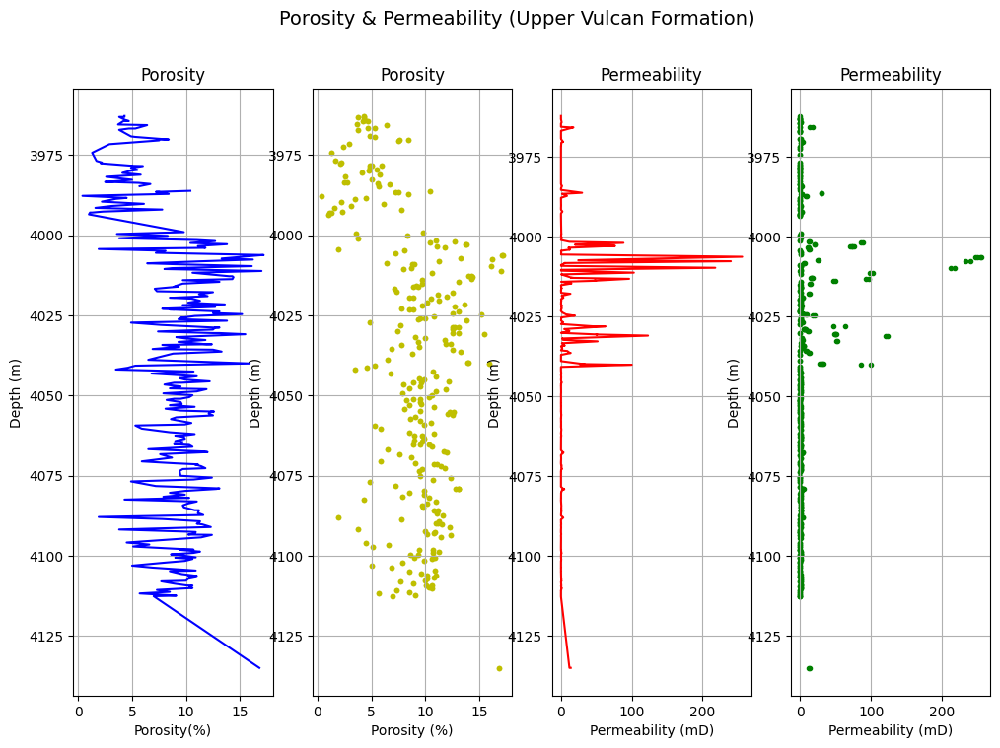

In [20]:
# Load the core data from the Excel file
core_data_table = pd.read_excel(r"D:\Case study\Core_data.xlsx")

# Get column names as a list
column_names = core_data_table.columns.tolist()

# Print the column names
print("Column names:", column_names)

# Access the 'Top depth (m)' column as an array (column vector)
top_depth_data = core_data_table['Top depth (m)']
porosity = core_data_table['Porosity (%)']
permeability = core_data_table['Permeability (mD)']
Bulk_density = core_data_table['Bulk density (g/cc)']

Grain_density = core_data_table['Grain density (g/cc)']
# filtering the dat based on the depth range of the Upper Vulcan formation 
depth_range_filter = (top_depth_data >= 3911.5) & (top_depth_data <= 4218)

# Data set of upper vulcan formation: depth,porosity,permeability
depth_uv = top_depth_data[depth_range_filter]
porosity_vulcan = porosity[depth_range_filter]
permeability_vulcan = permeability[depth_range_filter]
Bulk_density_vulcan = Bulk_density[depth_range_filter]
Grain_density_vulcan = Grain_density[depth_range_filter]
# Create a new figure
plt.figure(figsize=(12, 8))

# Plot Porosity 
plt.subplot(1, 4, 1)  # Create the first subplot
plt.plot(porosity_vulcan, depth_uv, 'b')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Porosity(%)')
plt.ylabel('Depth (m)')
plt.title('Porosity')

# Plot Porosity 
plt.subplot(1, 4, 2)  # Create the first subplot
plt.scatter(porosity_vulcan, depth_uv, c='y', marker='.')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Porosity (%)')
plt.ylabel('Depth (m)')
plt.title('Porosity')

# Plot Permeability
plt.subplot(1, 4, 3)  # Create the second subplot
plt.plot(permeability_vulcan, depth_uv, 'r')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Permeability (mD)')
plt.ylabel('Depth (m)')
plt.title('Permeability')

# Plot Permeability
plt.subplot(1, 4, 4)  # Create the second subplot
plt.scatter(permeability_vulcan, depth_uv, c='g', marker='.')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Permeability (mD)')
plt.ylabel('Depth (m)')
plt.title('Permeability')

# Adjust the layout of subplots
plt.suptitle('Porosity & Permeability (Upper Vulcan Formation)', fontsize=14)

# Set major and minor ticks for the Y-axis
ax1 = plt.subplot(1, 4, 1)
ax2 = plt.subplot(1, 4, 2)
ax3 = plt.subplot(1, 4, 3)
ax4 = plt.subplot(1, 4, 4)
ax1.yaxis.set_minor_locator(plt.MultipleLocator(100)) 
ax2.yaxis.set_minor_locator(plt.MultipleLocator(100))  
ax3.yaxis.set_minor_locator(plt.MultipleLocator(100))  
ax4.yaxis.set_minor_locator(plt.MultipleLocator(100))  

plt.show()


modified data (cleaned and after removing outlier )

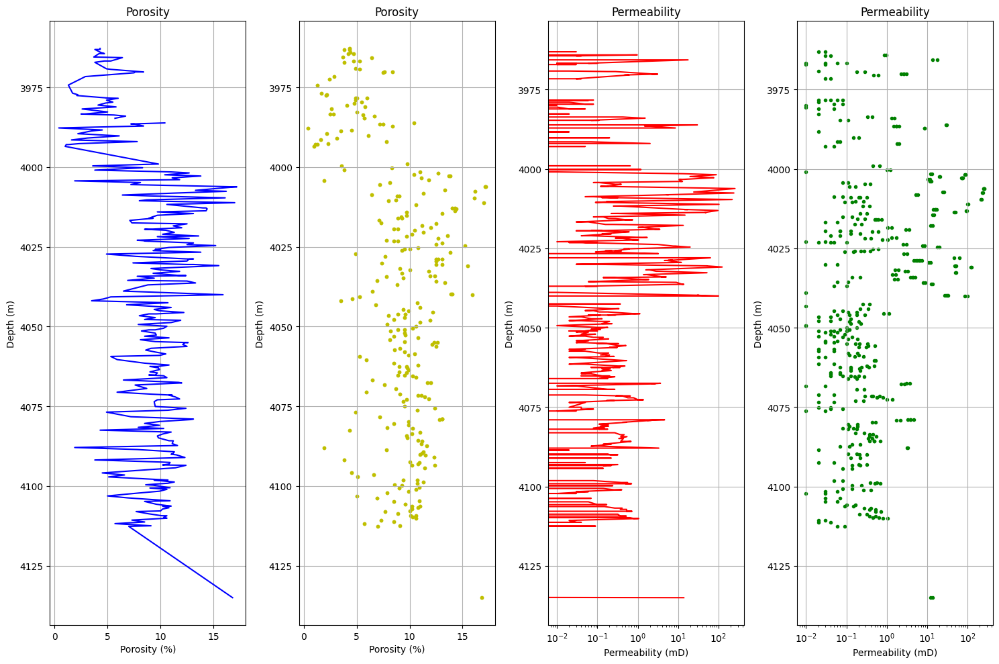

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Create a new figure and a grid of subplots
fig, axes = plt.subplots(1, 4, figsize=(15, 10))

# Plot Porosity
axes[0].plot(porosity_vulcan, depth_uv, 'b')
axes[0].invert_yaxis()
axes[0].grid(True)
axes[0].set_xlabel('Porosity (%)')
axes[0].set_ylabel('Depth (m)')
axes[0].set_title('Porosity')

# Plot Porosity as a scatter plot
axes[1].scatter(porosity_vulcan, depth_uv, c='y', marker='.')
axes[1].invert_yaxis()
axes[1].grid(True)
axes[1].set_xlabel('Porosity (%)')
axes[1].set_ylabel('Depth (m)')
axes[1].set_title('Porosity')

# Plot Permeability
axes[2].plot(permeability_vulcan, depth_uv, 'r')
axes[2].invert_yaxis()
axes[2].grid(True)
axes[2].set_xscale('log')
axes[2].set_xlabel('Permeability (mD)')
axes[2].set_ylabel('Depth (m)')
axes[2].set_title('Permeability')

# Plot Permeability as a scatter plot with a semilog x-axis
axes[3].scatter(permeability_vulcan, depth_uv, c='g', marker='.')
axes[3].invert_yaxis()
axes[3].grid(True)
axes[3].set_xscale('log')  # Set x-axis to be semilogarithmic
axes[3].set_xlabel('Permeability (mD)')
axes[3].set_ylabel('Depth (m)')
axes[3].set_title('Permeability')

# Adjust the layout of subplots
#plt.suptitle('Porosity & Permeability (Upper Vulcan Formation)', fontsize=14)

# Set major and minor ticks for the Y-axis
for ax in axes:
    ax.yaxis.set_minor_locator(plt.MultipleLocator(100))

plt.tight_layout()
plt.show()


In [1]:
# Load the core data which is  cleaned for the NaN value  from the Excel file 
core_depporper = pd.read_excel(r"C:\Users\Ritesh\Downloads\case study\core_dep_por_perm_CLEANED.xlsx")

# Get column names as a list 
column_names = core_depporper.columns.tolist()

# Print the column names 
print("Column names:", column_names)


# Access the 'Top depth (m)' column as an array (column vector)
top_depth_data_cl = core_depporper['Top depth (m)']
porosity_cl = core_depporper['Porosity (%)']
permeability_cl = core_depporper['Permeability (mD)']


# filtering the dat based on thae depth range of the Upper Vulcan formation 
depth_range_filter = (top_depth_data_cl >= 3911.5) & (top_depth_data_cl <= 4218)

# Data set of upper vulcan formation: depth,porosity,permeability
depth_cl = top_depth_data_cl[depth_range_filter]
porosity_vulcan_cl = porosity_cl[depth_range_filter]
permeability_vulcan_cl = permeability_cl[depth_range_filter]
# Create a new figure
plt.figure(figsize=(12, 8))

# Plot Porosity 
plt.subplot(1, 4, 1)  # Create the first subplot
plt.plot(porosity_vulcan_cl, depth_cl, 'b')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Porosity(%)')
plt.ylabel('Depth (m)')
plt.title('Porosity')

# Plot Porosity 
plt.subplot(1, 4, 2)  # Create the first subplot
plt.scatter(porosity_vulcan_cl, depth_cl, c='y', marker='.')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Porosity (%)')
plt.ylabel('Depth (m)')
plt.title('Porosity')

# Plot Permeability
plt.subplot(1, 4, 3)  # Create the second subplot
plt.plot(permeability_vulcan_cl, depth_cl, 'r')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Permeability (mD)')
plt.ylabel('Depth (m)')
plt.title('Permeability')

# Plot Permeability
plt.subplot(1, 4, 4)  # Create the second subplot
plt.scatter(permeability_vulcan_cl, depth_cl, c='g', marker='.')
plt.gca().invert_yaxis()
plt.grid(True)
plt.xlabel('Permeability (mD)')
plt.ylabel('Depth (m)')
plt.title('Permeability')

# Adjust the layout of subplots
plt.suptitle('Porosity & Permeability (Upper Vulcan Formation)', fontsize=14)

# Set major and minor ticks for the Y-axis
ax1 = plt.subplot(1, 4, 1)
ax2 = plt.subplot(1, 4, 2)
ax3 = plt.subplot(1, 4, 3)
ax4 = plt.subplot(1, 4, 4)
ax1.yaxis.set_minor_locator(plt.MultipleLocator(100)) 
ax2.yaxis.set_minor_locator(plt.MultipleLocator(100))  
ax3.yaxis.set_minor_locator(plt.MultipleLocator(100))  
ax4.yaxis.set_minor_locator(plt.MultipleLocator(100))  

plt.show()

# Load the core data which in which outlier are removed using matlab, from the Excel file
core_porper_CLRO = pd.read_excel(r'C:\Users\Ritesh\Downloads\case study\core_dep_por_perm_CLN_rmotl.xlsx')

# Get column names as a list
column_names = core_porper_CLRO.columns.tolist()

# Print the column names
print("Column names:", column_names)

# Access the 'Top depth (m)' column as an array (column vector)
porosity_mat = core_porper_CLRO['Porosity (%)']
permeability_mat = core_porper_CLRO['Permeability (mD)']


### Optimize total porosity calculation (combination of neutron and density log) after calibrating with core data.


### Step no. 1 : to determine the correct matrix density using lithology logs

Logs can be used as indicators of lithology. The most useful logs for this purpose are:

•	 Density log: rb and Pe

•	 Neutron log: fN

•	 Sonic log: Dt

•	 Gamma ray log: natural gamma and gamma ray spectra

Note: here since Sonic log is consist of missing value so for now we can avoid using sonic log since others are availble 


In [ ]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((1, 4), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 4), (0, 1), rowspan=1, colspan=1)
ax3 = plt.subplot2grid((1, 4), (0, 2), rowspan=1, colspan=1)
ax4 = plt.subplot2grid((1, 4), (0, 3), rowspan=1, colspan=1)


ax1.plot(df3uv.CALI, df3uv.DEPTH, lw=0.5, color='blue')
ax1.fill_betweenx(df3uv.DEPTH, df3uv.BS, df3uv.CALI, facecolor='yellow')
ax1.set_xlabel('Caliper (inches)')
ax1.set_ylabel('Depth (m)')
ax1.set_ylim(max_value, min_value) # Reversed the y-axis limits
ax1.set_xlim(5,14)
ax1.tick_params(axis='x', colors='b')
ax1.spines['top'].set_edgecolor('b')
ax1.spines['top'].set_position(("axes", 1.0))
ax1.xaxis.set_ticks_position('top')
ax1.set_xlabel('Caliper',color='b', fontsize=14)
ax1.xaxis.set_label_position('top')
ax1.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

ax11=ax1.twiny()

ax11.plot(df3uv.BS, df3uv.DEPTH, lw=0.5, color='red', linestyle='dashed')
ax11.set_xlim(5,14)
ax11.tick_params(axis='x', colors='r')
ax11.spines['top'].set_edgecolor('r')
ax11.spines['top'].set_position(("axes", 1.04))
ax11.set_xlabel('Bit size',color='r',fontsize=14)
ax11.xaxis.set_label_position('top')
ax1.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

# Check the condition and plot horizontal lines
condition = abs(df3uv.BS - df3uv.CALI) > tol_val
for depth, is_condition_met in zip(df3uv.DEPTH, condition):
    if is_condition_met:
        ax1.axhline(y=depth, color='red', alpha=0.05)


ax2.plot(df3uv.GR, df3uv.DEPTH, lw=0.5, color='green')
ax2.set_ylabel('Depth (m)')
ax2.set_xlim(0, 200)
ax2.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax2.tick_params(axis='x', colors='g')
ax2.spines['top'].set_edgecolor('g')
ax2.spines['top'].set_position(("axes", 1.0))
ax2.xaxis.set_ticks_position('top')
ax2.set_xlabel('Gamma Ray (API)',color='g', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


ax3.plot(df3uv.RHOB, df3uv.DEPTH, lw=0.5, color='magenta')
ax3.set_ylabel('Depth (m)')
ax3.set_xlim(1.95, 2.95)
ax3.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax3.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)
ax3.tick_params(axis='x', colors='magenta')
ax3.spines['top'].set_edgecolor('magenta')
ax3.spines['top'].set_position(("axes", 1.0))
ax3.xaxis.set_ticks_position('top')
ax3.set_xlabel('Density (g/cc)',color='magenta', fontsize=14)
ax3.xaxis.set_label_position('top')
ax3.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


ax4.plot(df3uv.PEF, df3uv.DEPTH, lw=0.5, color='c')
ax4.set_ylabel('Depth (m)')
ax4.set_xlim(0, 10)
ax4.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax4.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)
ax4.tick_params(axis='x', colors='c')
ax4.spines['top'].set_edgecolor('magenta')
ax4.spines['top'].set_position(("axes", 1.0))
ax4.xaxis.set_ticks_position('top')
ax4.set_xlabel('photoelectric factor',color='c', fontsize=14)
ax4.xaxis.set_label_position('top')
ax4.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

Observations:

1. In the depth range of 3950-4000 meters and adjacent depths, we encounter a challenging borehole condition. This adversely affects the accuracy of log measurements, leading to ambiguous data and the emergence of outliers. To mitigate this issue, we should place more reliance on measurements from nearby zones with better conditions.


2. Analyzing the PEF (Photoelectric Factor) log reveals the presence of three distinct geological formations:
   (i) Approximately 3911 m to 3950 m, characterized by PEF values between 3.5 and 7, along with noticeable variations in the GR      (Gamma Ray) and Density logs.
   
   (ii) Within the range of approximately 3950 m to 4100 m, PEF values hover around 2.5 to 3, accompanied by changes in the GR      and Density logs.
   
   (iii) Beyond 4200 meters, we find PEF values ranging from about 3 to 5, with corresponding shifts in the GR and Density logs.

Note: To address outliers resulting from the bad borehole condition, it's important to consider adjacent zones for identifying the type of formation rock. However, some level of ambiguity may persist due to these outlier issues.

To enhance the accuracy and visualization of depth range values for your observations, you can utilize the Plotly library, which provides interactive and more informative plots. 

(Here's a statement to install the Plotly library pip install plotly)


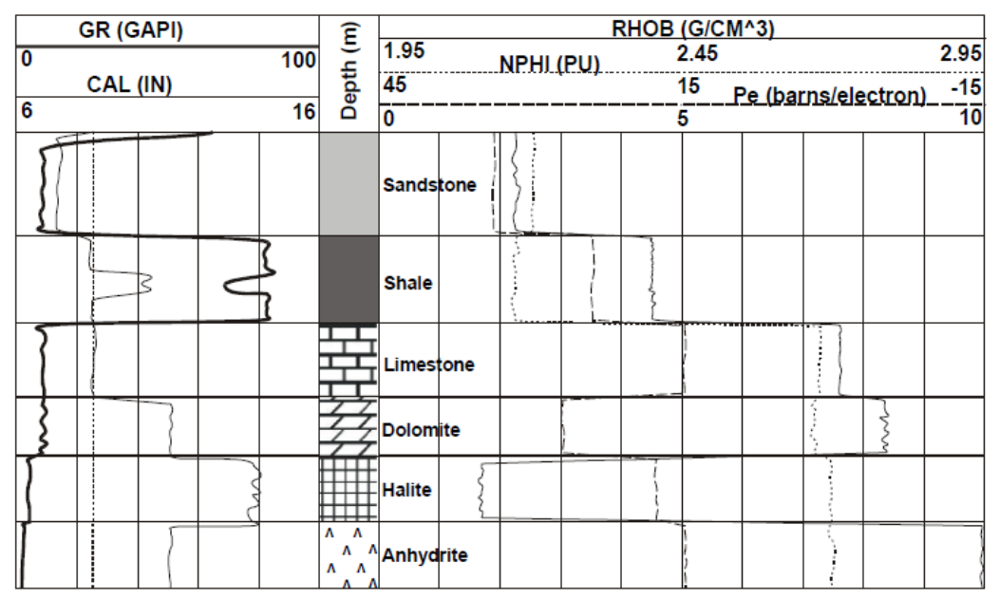

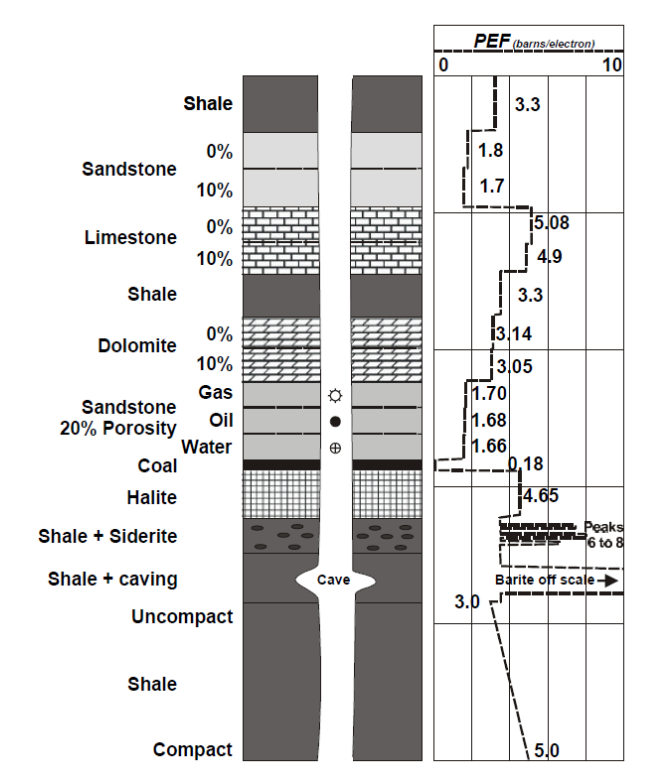

In [ ]:
import plotly.subplots as sp
import plotly.graph_objects as go
import pandas as pd


# Create a subplot with four side-by-side subplots
fig = sp.make_subplots(rows=1, cols=4, subplot_titles=['Caliper', 'Gamma Ray', 'Density (g/cc)', 'Photoelectric Factor'])

# Create the subplots
trace1 = go.Scatter(x=df3uv['CALI'], y= df3uv['DEPTH'], mode='lines', line=dict(width=1, color='blue'), name='Caliper')
trace2 = go.Scatter(x=df3uv['GR'], y= df3uv['DEPTH'], mode='lines', line=dict(width=1, color='green'), name='Gamma Ray')
trace3 = go.Scatter(x=df3uv['RHOB'], y= df3uv['DEPTH'], mode='lines', line=dict(width=1, color='magenta'), name='Density (g/cc)')
trace4 = go.Scatter(x=df3uv['PEF'], y= df3uv['DEPTH'], mode='lines', line=dict(width=1, color='cyan'), name='Photoelectric Factor')
trace5 = go.Scatter(x=df3uv['BS'], y= df3uv['DEPTH'], mode='lines', line=dict(width=1, color='blue'), name='Caliper')
# Add the traces to the subplots
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)
fig.add_trace(trace3, row=1, col=3)
fig.add_trace(trace4, row=1, col=4)

# Update subplot layout
fig.update_xaxes(title_text='Caliper (inches)', row=1, col=1, showline=True, linewidth=0.5, linecolor='blue', range=[5, 14])

fig.update_xaxes(title_text='Gamma Ray (API)', row=1, col=2, showline=True, linewidth=0.5, linecolor='green', range=[0, 200])

fig.update_xaxes(title_text='Density (g/cc)', row=1, col=3, showline=True, linewidth=0.5, linecolor='magenta', range=[1.95, 2.95])

fig.update_xaxes(title_text='Photoelectric Factor', row=1, col=4, showline=True, linewidth=0.5, linecolor='cyan', range=[0, 5])
fig.update_yaxes(title_text='Depth (m)', row=1, col=1, autorange='reversed', gridwidth=0.8)
fig.update_yaxes(title_text='Depth (m)', row=1, col=2, autorange='reversed', gridwidth=0.8)
fig.update_yaxes(title_text='Depth (m)', row=1, col=3, autorange='reversed', gridwidth=0.8)
fig.update_yaxes(title_text='Depth (m)', row=1, col=4, autorange='reversed', gridwidth=0.8)


# Show the interactive plot
fig.update_layout(title='Well Log Data', showlegend=False, width=800, height=1400)
fig.show()


Observation : Utilizing the interactive plot created with the Plotly library, we can categorize the well logs into Eight distinct intervals:

 (1) 3911.5 m to 3948 m : Matrix-1
 
 (2) 3948 m to 3990 m   : Total Bad bore condition-1 
 
 (3) 3970.325 m to 4000.195 : Matrix-2
 
 (4) 3990 m to 4112 m   : Matrix-3
 
 (5) 4112 m to 4134 m   : matrix-4
 
 (6) 4134 m to 4140 m   : Matrix-5
 
 (7) 4140 m to 4193 m   : Matrix-6
 
 (8) 4193 m to 4200 m   : Matrix-7
 
 (9) 4200 m to 4218 m   : Total Bad bore condition-2

In [ ]:
df3uv_1 = df3uv[df3uv['DEPTH'] >=3911.5 ][df3uv['DEPTH'] <3948] 
df3uv_b1 = df3uv[df3uv['DEPTH'] >=3948 ][df3uv['DEPTH'] < 3970]
df3uv_b1ss=df3uv[df3uv['DEPTH'] >=3970.325 ][df3uv['DEPTH'] < 4002]
df3uv_2 = df3uv[df3uv['DEPTH'] >=4000 ][df3uv['DEPTH'] < 4112] 
df3uv_3 = df3uv[df3uv['DEPTH'] >=4112][df3uv['DEPTH'] <4134] 
df3uv_4 = df3uv[df3uv['DEPTH'] >=4134][df3uv['DEPTH'] <4140] 
df3uv_5 = df3uv[df3uv['DEPTH'] >=4140][df3uv['DEPTH'] <4193] 
df3uv_6 = df3uv[df3uv['DEPTH'] >=4193][df3uv['DEPTH'] <4200] 
df3uv_b2 = df3uv[df3uv['DEPTH'] >=4200][df3uv['DEPTH'] <= 4218] 

average_1 = df3uv_1.mean()
average_b1 = df3uv_b1.mean()
average_b1ss=df3uv_b1ss.mean()
average_2 = df3uv_2.mean()
average_3 = df3uv_3.mean()
average_4 = df3uv_4.mean()
average_5 = df3uv_5.mean()
average_6 = df3uv_6.mean()
average_b2 = df3uv_b2.mean()

print('   ','Mean GR','          ','Mean RHOB','       ','Mean PEF')
print( average_1.GR,'  ',average_1.RHOB,' ',average_1.PEF)
print(average_b1.GR,'  ',average_b1.RHOB,' ',average_b1.PEF)
print(average_2.GR,'  ',average_2.RHOB,' ',average_2.PEF)
print(average_3.GR,'  ',average_3.RHOB,' ',average_3.PEF)
print(average_4.GR,'          ',average_4.RHOB,' ',average_4.PEF)
print(average_5.GR,'  ',average_5.RHOB,' ',average_5.PEF)
print(average_6.GR,'  ',average_6.RHOB,' ',average_6.PEF)
print(average_b2.GR,'  ',average_b2.RHOB,' ',average_b2.PEF)

NameError: name 'average_1' is not defined

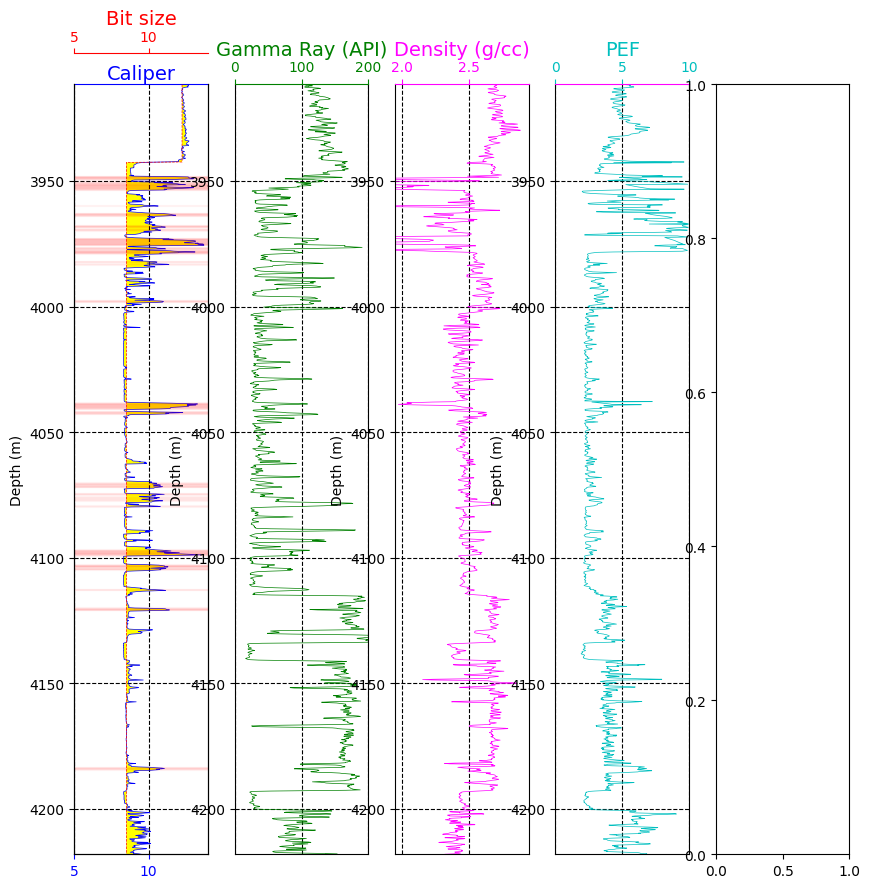

In [23]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((1, 5), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 5), (0, 1), rowspan=1, colspan=1)
ax3 = plt.subplot2grid((1, 5), (0, 2), rowspan=1, colspan=1)
ax4 = plt.subplot2grid((1, 5), (0, 3), rowspan=1, colspan=1)
ax5 = plt.subplot2grid((1, 5), (0, 4), rowspan=1, colspan=1)


ax1.plot(df3uv.CALI, df3uv.DEPTH, lw=0.5, color='blue')
ax1.fill_betweenx(df3uv.DEPTH, df3uv.BS, df3uv.CALI, facecolor='yellow')
ax1.set_xlabel('Caliper (inches)')
ax1.set_ylabel('Depth (m)')
ax1.set_ylim(max_value, min_value) # Reversed the y-axis limits
ax1.set_xlim(5,14)
ax1.tick_params(axis='x', colors='b')
ax1.spines['top'].set_edgecolor('b')
ax1.spines['top'].set_position(("axes", 1.0))
ax1.xaxis.set_ticks_position('top')
ax1.set_xlabel('Caliper',color='b', fontsize=14)
ax1.xaxis.set_label_position('top')
ax1.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

ax11=ax1.twiny()

ax11.plot(df3uv.BS, df3uv.DEPTH, lw=0.5, color='red', linestyle='dashed')
ax11.set_xlim(5,14)
ax11.tick_params(axis='x', colors='r')
ax11.spines['top'].set_edgecolor('r')
ax11.spines['top'].set_position(("axes", 1.04))
ax11.set_xlabel('Bit size',color='r',fontsize=14)
ax11.xaxis.set_label_position('top')
ax1.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

# Check the condition and plot horizontal lines
condition = abs(df3uv.BS - df3uv.CALI) > tol_val
for depth, is_condition_met in zip(df3uv.DEPTH, condition):
    if is_condition_met:
        ax1.axhline(y=depth, color='red', alpha=0.05)


ax2.plot(df3uv.GR, df3uv.DEPTH, lw=0.5, color='green')
ax2.set_ylabel('Depth (m)')
ax2.set_xlim(0, 200)
ax2.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax2.tick_params(axis='x', colors='g')
ax2.spines['top'].set_edgecolor('g')
ax2.spines['top'].set_position(("axes", 1.0))
ax2.xaxis.set_ticks_position('top')
ax2.set_xlabel('Gamma Ray (API)',color='g', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


ax3.plot(df3uv.RHOB, df3uv.DEPTH, lw=0.5, color='magenta')
ax3.set_ylabel('Depth (m)')
ax3.set_xlim(1.95, 2.95)
ax3.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax3.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)
ax3.tick_params(axis='x', colors='magenta')
ax3.spines['top'].set_edgecolor('magenta')
ax3.spines['top'].set_position(("axes", 1.0))
ax3.xaxis.set_ticks_position('top')
ax3.set_xlabel('Density (g/cc)',color='magenta', fontsize=14)
ax3.xaxis.set_label_position('top')
ax3.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


ax4.plot(df3uv.PEF, df3uv.DEPTH, lw=0.5, color='c')
ax4.set_ylabel('Depth (m)')
ax4.set_xlim(0, 10)
ax4.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax4.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)
ax4.tick_params(axis='x', colors='c')
ax4.spines['top'].set_edgecolor('magenta')
ax4.spines['top'].set_position(("axes", 1.0))
ax4.xaxis.set_ticks_position('top')
ax4.set_xlabel('PEF',color='c', fontsize=14)
ax4.xaxis.set_label_position('top')
ax4.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)


x1_1, y1_1 = average_1['PEF'], df3uv_1['DEPTH'].iloc[0]
x2_1, y2_1 = average_1['PEF'], df3uv_1['DEPTH'].iloc[-1]

x1_2, y1_2 = average_2['PEF'], df3uv_b1['DEPTH'].iloc[0]
x2_2, y2_2 = average_2['PEF'], df3uv_2['DEPTH'].iloc[-1]

x1_3, y1_3 = average_3['PEF'], df3uv_3['DEPTH'].iloc[0]
x2_3, y2_3 = average_3['PEF'], df3uv_3['DEPTH'].iloc[-1]

x1_4, y1_4 = average_4['PEF'], df3uv_4['DEPTH'].iloc[0]
x2_4, y2_4 = average_4['PEF'], df3uv_4['DEPTH'].iloc[-1]

x1_5, y1_5 = average_5['PEF'], df3uv_5['DEPTH'].iloc[0]
x2_5, y2_5 = average_5['PEF'], df3uv_5['DEPTH'].iloc[-1]

x1_6, y1_6 = average_6['PEF'], df3uv_6['DEPTH'].iloc[0]
x2_6, y2_6 = average_6['PEF'], df3uv_6['DEPTH'].iloc[-1]

x1_7, y1_7 = average_b2['PEF'], df3uv_b2['DEPTH'].iloc[0]
x2_7, y2_7 = average_b2['PEF'], df3uv_b2['DEPTH'].iloc[-1]

# Use the plot function to draw the straight line with a different color (e.g., 'red')
ax4.plot([x1_1, x2_1], [y1_1, y2_1], color='red', linewidth=1, label='Line')
ax4.plot([x1_2, x2_2], [y1_2, y2_2], color='yellow', linewidth=2, label='Line')
ax4.plot([x1_3, x2_3], [y1_3, y2_3], color='red', linewidth=1, label='Line')
ax4.plot([x1_4, x2_4], [y1_4, y2_4], color='yellow', linewidth=2, label='Line')
ax4.plot([x1_5, x2_5], [y1_5, y2_5], color='red', linewidth=1, label='Line')
ax4.plot([x1_6, x2_6], [y1_6, y2_6], color='yellow', linewidth=2, label='Line')
ax4.plot([x1_7, x2_7], [y1_7, y2_7], color='red', linewidth=1, label='Line')

# Use the plot function to draw horizontal lines with a different color (e.g., 'red')
ax4.plot([x1_2, x2_1], [y1_2, y2_1], color='red', linewidth=1, label='Line')
ax4.plot([x1_3, x2_2], [y1_3, y2_2], color='red', linewidth=1, label='Line')
ax4.plot([x1_4, x2_3], [y1_4, y2_3], color='red', linewidth=1, label='Line')
ax4.plot([x1_5, x2_4], [y1_5, y2_4], color='red', linewidth=1, label='Line')
ax4.plot([x1_6, x2_5], [y1_6, y2_5], color='red', linewidth=1, label='Line')
ax4.plot([x1_7, x2_6], [y1_7, y2_6], color='red', linewidth=1, label='Line')

ax5.plot(df3uv.TNPH, df3uv.DEPTH, lw=0.5, color='r')
ax5.set_ylabel('Depth (m)')
#ax5.set_xlim(0, 200)
ax5.set_ylim(max_value,min_value)  # Reversed the y-axis limits
ax5.tick_params(axis='x', colors='r')
ax5.spines['top'].set_edgecolor('r')
ax5.spines['top'].set_position(("axes", 1.0))
ax5.xaxis.set_ticks_position('top')
ax5.set_xlabel('NPHI',color='r', fontsize=14)
ax5.xaxis.set_label_position('top')
ax5.grid(which='both',color='black', axis='both', alpha=1, linestyle='--',linewidth=0.8)

# Add this line before saving or showing the plot
#plt.tight_layout()
plt.suptitle("Lithology Logs", fontsize=16, y=1.02)
# Show the plot
plt.show()

# Save the plot
fig.savefig('C:/Users/Ritesh/OneDrive/Desktop/Casestudy_PEFlog.png')

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import itertools

depth_boundary=np.array([3911.5,3948,3978,4000.195,4114.5,4134,4140,4193,4200,4218])

selected_column_1='GR'
selected_column_2='PEF'
selected_column_3='RHOB'
selected_column_4='TNPH'
num_lithlog=4
# Assuming you have defined these variables:
# num_lithlog = ...
# selected_column_1 = ...
# selected_column_2 = ...
# ...

# Create a figure with subplots
fig, axes = plt.subplots(1, num_lithlog + 1, sharey=True, figsize=(8, 10))

# Plot the CALI column in the first subplot
axes[0].plot(df3uv['CALI'], df3uv['DEPTH'], color='blue', linewidth=1)
for depth, is_condition_met in zip(df3uv.DEPTH, condition):
    if is_condition_met:
        axes[0].axhline(y=depth, color='red',alpha=0.09)

# Define a list of colors for each subplot
subplot_colors = ['green', 'blue', 'red', 'purple', 'orange']  # Add more colors if needed
color_iterator = itertools.cycle(subplot_colors)

for i in range(num_lithlog):
    column_name = eval(f"selected_column_{i + 1}")  # Use the correct dynamic column name
    color = next(color_iterator)
    axes[i + 1].plot(df3uv[column_name], df3uv['DEPTH'], color=color, linewidth=0.5, label=column_name)
    for j in range(len(depth_boundary) - 1):
        lower_boundary = depth_boundary[j]
        upper_boundary = depth_boundary[j + 1]
        section_data = df3uv[(df3uv['DEPTH'] > lower_boundary) & (df3uv['DEPTH'] < upper_boundary)]
        mean_value = section_data[column_name].mean()
        axes[i + 1].plot([mean_value, mean_value],[ lower_boundary, upper_boundary], color='yellow', linewidth=1)
        axes[i + 1].plot([df3uv[column_name].min(), df3uv[column_name].max()],[upper_boundary, upper_boundary], color='#FF1493', linewidth=1)
        

# Set common y-axis label and reverse it
axes[0].set_ylabel('Depth (m)')
for ax in axes:
    ax.set_ylim(max(df3uv['DEPTH']), min(df3uv['DEPTH']))
    ax.grid(True)
    ax.legend()
    #ax.set_xlabel(ax.get_legend().get_texts()[0].get_text())

# Set the title
plt.suptitle('Lithology log plot ', y=1.02)

# Show the plot
plt.tight_layout()
plt.show()


correction the Matrix density based on the PEF log 

In [ ]:

            
#import numpy as np
#rhoshale=2.71
#rhosand=2.65
## Create an empty pma array with the same length as df3uv
#pma_array = np.zeros(len(df3uv))
#
## Set pma values based on depth conditions
## (1) 3911.5 m to 3940 m : Matrix-1 pma = 2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 3911.5) & (df3uv['DEPTH'] < 3948)] = rhoshale
#
## (2) 3940 m to 3990 m : Total Bad bore condition-1: pma=2.65
#pma_array[(df3uv['DEPTH'] >= 3948) & (df3uv['DEPTH'] < 3990)] = rhosand
#
## (3) 3990 m to 4112 m : Matrix-2 pma =  2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 3990) & (df3uv['DEPTH'] < 4112)] = rhosand
#
## (4) 4112 m to 4134 m : matrix-3 pma= 2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 4112) & (df3uv['DEPTH'] < 4134)] = rhoshale
#
## (5) 4134 m to 4140 m : Matrix-4 pma= 2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 4134) & (df3uv['DEPTH'] < 4140)] = rhosand
#
## (6) 4140 m to 4193 m : Matrix-5 pma= 2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 4140) & (df3uv['DEPTH'] < 4193)] =rhoshale
#
# (7) 4193 m to 4200 m : Matrix-6 pma= 2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 4193) & (df3uv['DEPTH'] < 4200)] = rhosand
#
## (8) 4200 m to 4218 m : Total Bad bore condition-2 : pma= 2.7-2.8
#pma_array[(df3uv['DEPTH'] >= 4200) & (df3uv['DEPTH'] <= 4218)] = rhoshale
#

In [26]:
import numpy as np

depth_boundary = np.array([3911.5, 3948, 3970.325, 4000.195, 4112, 4134, 4140, 4193, 4200, 4218])
num_of_form = len(depth_boundary)

print('Number of lithology separated:', num_of_form)

pma_array = np.zeros(len(df3uv))
RHOMA = []  # Define the RHOMA list

for i in range(num_of_form):
    rhoshale = 2.71
    rhosand = 2.65
    if i % 2 == 1:
        RHOMA.append(rhosand)
    else:
        RHOMA.append(rhoshale)

print(RHOMA)

for i in range(num_of_form - 1):  # Adjust the loop range to avoid IndexError
    condition_boundary = (df3uv['DEPTH'] >= depth_boundary[i]) & (df3uv['DEPTH'] <= depth_boundary[i + 1])
    pma_array[condition_boundary] = RHOMA[i]

print(pma_array)


Number of lithology separated: 10
[2.71, 2.65, 2.71, 2.65, 2.71, 2.65, 2.71, 2.65, 2.71, 2.65]
[2.71 2.71 2.71 ... 2.71 2.71 2.71]


In [27]:
'''Density porosity(DPHI) calculation'''
Pfl=1       #fluid density
DPHI=(pma_array-(df3uv['RHOB'])) /(pma_array-Pfl)



# Calculalatign the effective density porosity

Applying the gas correction and the shale porosity 

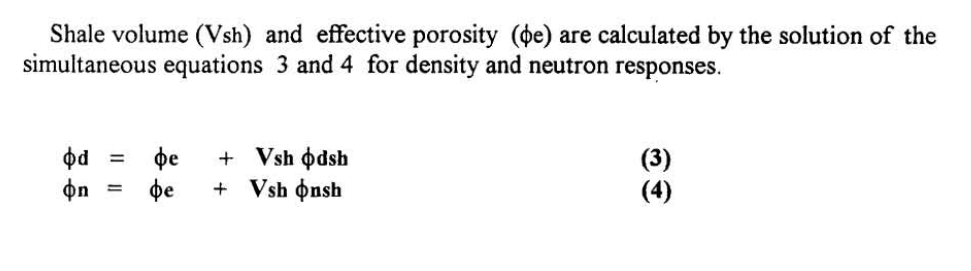

In [28]:
import numpy as np
# Age of rock = Early Cretaceous
p05 = df3uv.GR.quantile(0.05)
p95 = df3uv.GR.quantile(0.95)
Igr = (df3uv['GR'] - p05) / (p95 - p05)  # gamma ray index
# Vshc calculation
Vshc_raw = 0.083 * (2 ** (3.7 * Igr) - 1)  # Vshc calculation for young tertiary rocks
Vshc = []

for i in Vshc_raw:
    if i >= 1:
        Vshc.append(1)
    else:
        Vshc.append(i)

# Rshc calculation
x = np.percentile(Vshc, 95)
DPHIshc = []
#DPHI=np.array(DPHI)
# Define a tolerance value
tol_val = 1  # Adjust this value as needed

for i in range(len(Vshc)):
    
        if Vshc[i]>=x and abs(df3uv.BS.iloc[i] - df3uv.CALI.iloc[i]) < tol_val:
            DPHIshc.append(DPHI.iloc[i])

DPHIshc=np.array(DPHIshc)   
DPHIshc_mean=DPHIshc.mean()      
print(DPHIshc_mean) 

Vshc=np.array(Vshc)
Dphi_correction=Vshc*DPHIshc_mean
DPHI=DPHI-Vshc*DPHIshc_mean


0.021212165981141024


In [4]:
      
#Volume of shale (Vshc) calculation

# Age of rock = Early Cretaceous
p05 = df3uv.GR.quantile(0.05)
p95 = df3uv.GR.quantile(0.95)
Igr = (df3uv['GR'] - p05) / (p95 - p05)  # gamma ray index
Vshc = 0.083 * (2**(3.7 * Igr) - 1)  # Vshc calculation for young tertiary rocks

# Set up the figure and axes
fig, axes = plt.subplots(figsize=(15, 15))

# Set up individual log tracks/subplots
ax1 = plt.subplot2grid((1, 4), (0, 0), rowspan=1, colspan=1)
ax11 = ax1.twiny()
ax2 = plt.subplot2grid((1, 4), (0, 1), rowspan=1, colspan=1)
ax3 = plt.subplot2grid((1, 4), (0, 2), rowspan=1, colspan=1)
ax31 = ax3.twiny()
ax4 = plt.subplot2grid((1, 4), (0, 3), rowspan=1, colspan=1)
ax41 = ax4.twiny()
ax42 = ax4.twiny()

# Set up the log tracks
ax1.plot(df3uv['GR'], df3uv['DEPTH'], color='b', lw=1)
ax1.invert_yaxis()
ax1.tick_params(axis='x', colors='b')
ax1.spines['top'].set_edgecolor('b')
ax1.xaxis.set_ticks_position('top')
ax1.set_xlabel('Gamma Ray', color='b', fontsize=14)
ax1.xaxis.set_label_position('top')
ax1.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

ax11.plot(df3uv['CALI'], df3uv['DEPTH'], color='k', lw=1)
ax11.set_xlim(0, 15)
#ax11.axvline(x=bitsize, color='g', label='bitsize')
#ax11.axhline(y=m, color='r', label='Start of Bad-Borehole Zone', ls='--')
#ax11.axhline(y=n, color='g', label='End of Bad-Borehole Zone', ls='--')
ax11.legend()
ax11.axvline(p05, color='g', label='p05')
ax11.axvline(p95, color='g', label='p95')
ax11.spines['top'].set_position(("axes", 1.04))
ax11.xaxis.set_ticks_position('top')
ax11.set_xlabel('Calliper', fontsize=14)
ax11.xaxis.set_label_position('top')

ax2.plot(Vshc, df3uv['DEPTH'], color='r', lw=1)
ax2.invert_yaxis()
ax2.tick_params(axis='x', colors='r')
ax2.spines['top'].set_edgecolor('r')
ax2.xaxis.set_ticks_position('top')
ax2.set_xlabel('Vshc', color='r', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

ax3.plot(df3uv['RHOB'], df3uv['DEPTH'], color='b', lw=1)
ax3.invert_yaxis()
ax3.tick_params(axis='x', colors='b')
ax3.spines['top'].set_edgecolor('b')
ax3.xaxis.set_ticks_position('top')
ax3.set_xlabel('Density', color='b', fontsize=14)
ax3.xaxis.set_label_position('top')
ax3.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)


ax31.plot(df3uv['TNPH'], df3uv['DEPTH'], color='g', lw=1)
ax31.invert_xaxis()
ax31.tick_params(axis='x', colors='g')
ax31.spines['top'].set_edgecolor('g')
ax31.spines['top'].set_position(("axes", 1.04))
ax31.set_xlabel('Neutron Porosity', color='g', fontsize=14)
ax31.xaxis.set_label_position('top')
ax31.set_xlim(0.6,0)

ax4.plot(df3uv['RESS'], df3uv['DEPTH'], color='c', lw=1)
ax4.invert_yaxis()
#ax4.set_xlim(0, 700)
ax4.tick_params(axis='x', colors='c')
ax4.spines['top'].set_edgecolor('c')
ax4.xaxis.set_ticks_position('top')
ax4.set_xlabel('Flushed zone resistivity', color='c', fontsize=14)
ax4.xaxis.set_label_position('top')
ax4.grid(which='both', color='black', axis='both', alpha=0.5, linestyle='--', linewidth=0.8)
ax4.semilogx()

ax41.plot(df3uv['RESM'], df3uv['DEPTH'], color='g', lw=1)
ax41.invert_yaxis()
#ax41.set_xlim(0, 700)
ax41.tick_params(axis='x', colors='g')
ax41.spines['top'].set_edgecolor('g')
ax41.spines['top'].set_position(("axes", 1.05))
ax41.set_xlabel('Shallow Resistivity', color='g', fontsize=14)
ax41.xaxis.set_label_position('top')
#ax4.grid(which='both', color='black', axis='both', alpha=0.7, linestyle='--', linewidth=0.8)
ax41.semilogx()

ax42.plot(df3uv['RESD'], df3uv['DEPTH'], color='b', lw=1)
#ax42.set_xlim(0, 700)
ax42.invert_yaxis()
ax42.spines['top'].set_edgecolor('b')
ax42.spines['top'].set_position(("axes", 1.1))
ax42.tick_params(axis='x', colors='b')
ax42.set_xlabel('True resistivity', color='b', fontsize=14)
ax42.semilogx()

plt.suptitle("Quick-look log analysis for gas bearing zone (overlay NPHI & RHOB,resistivity)", fontsize=16, y=1.02)

fig.savefig('C:/Users/Ritesh/OneDrive/Desktop/Casestudy_Gas_bearing_zone.png')

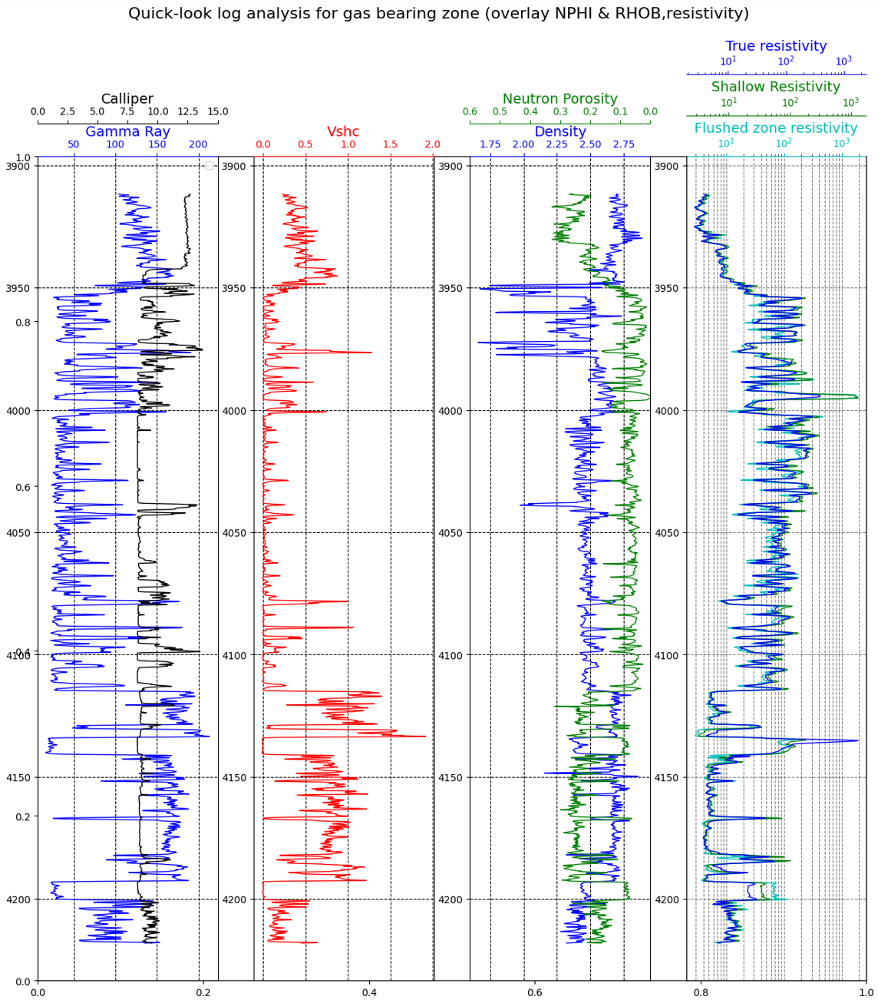

Applying the Gas correction 

In [ ]:
DPHI = DPHI * 0.8  # Correction for gas-bearing sandstone

In [ ]:
# Volume of shale (Vshc) calculation
# Age of rock = Early Cretaceous
p05 = df3uv.GR.quantile(0.05)
p95 = df3uv.GR.quantile(0.95)
Igr = (df3uv['GR'] - p05) / (p95 - p05)  # gamma ray index
Vshc = 0.083 * (2**(3.7 * Igr) - 1)  # Vshc calculation for young tertiary rocks

# Set up the figure and axes
fig, axes = plt.subplots(figsize=(15, 15))

# Set up individual log tracks/subplots
ax1 = plt.subplot2grid((1, 4), (0, 0), rowspan=1, colspan=1)
ax11 = ax1.twiny()
ax2 = plt.subplot2grid((1, 4), (0, 1), rowspan=1, colspan=1)
ax3 = plt.subplot2grid((1, 4), (0, 2), rowspan=1, colspan=1)
ax31 = ax3.twiny()
ax4 = plt.subplot2grid((1, 4), (0, 3), rowspan=1, colspan=1)
ax41 = ax4.twiny()
ax42 = ax4.twiny()

# Set up the log tracks
ax1.plot(df3uv['GR'], df3uv['DEPTH'], color='b', lw=1)
ax1.invert_yaxis()
ax1.tick_params(axis='x', colors='b')
ax1.spines['top'].set_edgecolor('b')
ax1.xaxis.set_ticks_position('top')
ax1.set_xlabel('Gamma Ray', color='b', fontsize=14)
ax1.xaxis.set_label_position('top')
ax1.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

ax11.plot(df3uv['CALI'], df3uv['DEPTH'], color='k', lw=1)
ax11.set_xlim(0, 15)
#ax11.axvline(x=bitsize, color='g', label='bitsize')
#ax11.axhline(y=m, color='r', label='Start of Bad-Borehole Zone', ls='--')
#ax11.axhline(y=n, color='g', label='End of Bad-Borehole Zone', ls='--')
ax11.legend()
ax11.axvline(p05, color='g', label='p05')
ax11.axvline(p95, color='g', label='p95')
ax11.spines['top'].set_position(("axes", 1.04))
ax11.xaxis.set_ticks_position('top')
ax11.set_xlabel('Calliper', fontsize=14)
ax11.xaxis.set_label_position('top')

ax2.plot(Vshc, df3uv['DEPTH'], color='r', lw=1)
ax2.invert_yaxis()
ax2.tick_params(axis='x', colors='r')
ax2.spines['top'].set_edgecolor('r')
ax2.xaxis.set_ticks_position('top')
ax2.set_xlabel('Vshc', color='r', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

ax3.plot(DPHI, df3uv['DEPTH'], color='b', lw=1)
ax3.invert_yaxis()
ax3.set_xlim(0.45,-0.15 )
ax3.tick_params(axis='x', colors='b')
ax3.spines['top'].set_edgecolor('b')
ax3.xaxis.set_ticks_position('top')
ax3.set_xlabel('Density Porosity', color='b', fontsize=14)
ax3.xaxis.set_label_position('top')
ax3.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

ax31.plot(df3uv['TNPH'], df3uv['DEPTH'], color='g', lw=1)
#ax31.invert_xaxis()
ax31.set_xlim(0.45, 0)
ax31.tick_params(axis='x', colors='g')
ax31.spines['top'].set_edgecolor('g')
ax31.spines['top'].set_position(("axes", 1.04))
ax31.set_xlabel('Neutron Porosity', color='g', fontsize=14)
ax31.xaxis.set_label_position('top')


ax4.plot(df3uv['RESS'], df3uv['DEPTH'], color='c', lw=1)
ax4.invert_yaxis()
#ax4.set_xlim(0, 700)
ax4.tick_params(axis='x', colors='c')
ax4.spines['top'].set_edgecolor('c')
ax4.xaxis.set_ticks_position('top')
ax4.set_xlabel('Flushed zone resistivity', color='c', fontsize=14)
ax4.xaxis.set_label_position('top')
ax4.grid(which='both', color='black', axis='both', alpha=0.5, linestyle='--', linewidth=0.8)
ax4.semilogx()

ax41.plot(df3uv['RESM'], df3uv['DEPTH'], color='g', lw=1)
ax41.invert_yaxis()
#ax41.set_xlim(0, 700)
ax41.tick_params(axis='x', colors='g')
ax41.spines['top'].set_edgecolor('g')
ax41.spines['top'].set_position(("axes", 1.05))
ax41.set_xlabel('Shallow Resistivity', color='g', fontsize=14)
ax41.xaxis.set_label_position('top')
#ax4.grid(which='both', color='black', axis='both', alpha=0.7, linestyle='--', linewidth=0.8)
ax41.semilogx()

ax42.plot(df3uv['RESD'], df3uv['DEPTH'], color='b', lw=1)
#ax42.set_xlim(0, 700)
ax42.invert_yaxis()
ax42.spines['top'].set_edgecolor('b')
ax42.spines['top'].set_position(("axes", 1.1))
ax42.tick_params(axis='x', colors='b')
ax42.set_xlabel('True resistivity', color='b', fontsize=14)
ax42.semilogx()
plt.suptitle("Quick-look log analysis for gas bearing zone (overlay NPHI & DPHI,resistivity)", fontsize=16, y=1.02)

In [ ]:
# Create a new figure
fig = plt.figure(figsize=(15, 11))

# Create axes
ax1 = fig.add_subplot(151)
ax2 = fig.add_subplot(152)
ax3 = fig.add_subplot(153)
ax4 = fig.add_subplot(154)
ax5 = fig.add_subplot(155)

# Plot Caliper
ax1.plot(df3uv['CALI'], df3uv['DEPTH'], 'black', label='Caliper', linewidth=0.9)
ax1.invert_yaxis()
ax1.grid(True, which='both', color='black', linestyle='--', linewidth=0.8)
ax1.set_ylabel('Depth (m)')
ax1.xaxis.set_ticks_position('both')
#ax1.xaxis.set_minor_locator(plt.MultipleLocator(1))  # Minor ticks every 1 unit
ax1.tick_params(axis='x', which='both', top=True)
ax1.tick_params(axis='x', colors='black')
ax1.spines['top'].set_edgecolor('black')
ax1.xaxis.set_ticks_position('top')
ax1.set_xlabel('Caliper', color='black', fontsize=14)
ax1.xaxis.set_label_position('top')
ax1.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)



# Check the condition and plot horizontal lines
condition = abs(df3uv.BS - df3uv.CALI) > tol_val
for depth, is_condition_met in zip(df3uv.DEPTH, condition):
    if is_condition_met:
        ax1.axhline(y=depth, color='red', alpha=0.05)

# Plot Gamma Ray
ax2.plot(df3uv['GR'], df3uv['DEPTH'], 'b', label='Gamma Ray', linewidth=0.9)
ax2.invert_yaxis()
ax2.grid(True, which='both', color='black', linestyle='--', linewidth=0.8)
ax2.set_ylabel('Depth (m)')
ax2.xaxis.set_ticks_position('both')
#ax1.xaxis.set_minor_locator(plt.MultipleLocator(1))  # Minor ticks every 1 unit
ax2.tick_params(axis='x', which='both', top=True)
ax2.tick_params(axis='x', colors='b')
ax2.spines['top'].set_edgecolor('b')
ax2.xaxis.set_ticks_position('top')
ax2.set_xlabel('Gamma Ray', color='b', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

# Plot Porosity - Line Plot
ax3.plot(porosity_vulcan * 0.01, depth_uv, 'g', label='Porosity', linewidth=0.9)
ax3.invert_yaxis()
ax3.grid(True, which='both', color='black', linestyle='--', linewidth=0.8)
ax3.set_ylabel('Depth (m)')
ax3.xaxis.set_ticks_position('both')
#ax1.xaxis.set_minor_locator(plt.MultipleLocator(1))  # Minor ticks every 1 unit
ax3.tick_params(axis='x', which='both', top=True)
ax3.tick_params(axis='x', colors='g')
ax3.spines['top'].set_edgecolor('g')
ax3.xaxis.set_ticks_position('top')
ax3.set_xlabel('CORPOR', color='g', fontsize=14)
ax3.xaxis.set_label_position('top')
ax3.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

# Plot Porosity vs. DPHI
ax4.scatter(porosity_vulcan * 0.01, depth_uv, c='b', marker='.', label='Porosity', alpha=0.3)
ax4.plot(DPHI, df3uv['DEPTH'], 'y', label='DPHI', linewidth=0.8)
ax4.invert_yaxis()
ax4.grid(True, which='both', color='black', linestyle='--', linewidth=0.8)
ax4.set_ylabel('Depth (m)')
ax4.xaxis.set_ticks_position('both')
#ax1.xaxis.set_minor_locator(plt.MultipleLocator(1))  # Minor ticks every 1 unit
ax4.tick_params(axis='x', which='both', top=True)
ax4.tick_params(axis='x', colors='y')
ax4.spines['top'].set_edgecolor('y')
ax4.xaxis.set_ticks_position('top')
ax4.set_xlabel('CORPOR / DPHI', color='y', fontsize=14)
ax4.xaxis.set_label_position('top')
ax4.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)

# Plot DPHI - Line Plot
ax5.plot(df3uv['PEF'], df3uv['DEPTH'], 'm', label='PEF', linewidth=0.9)
ax5.invert_yaxis()
ax5.grid(True, which='both', color='black', linestyle='--', linewidth=0.8)
ax5.set_xlabel('PEF')
ax5.xaxis.set_ticks_position('both')
#ax1.xaxis.set_minor_locator(plt.MultipleLocator(1))  # Minor ticks every 1 unit
ax5.tick_params(axis='x', which='both', top=True)
ax5.tick_params(axis='x', colors='m')
ax5.spines['top'].set_edgecolor('m')
ax5.xaxis.set_ticks_position('top')
ax5.set_xlabel('PEF', color='m', fontsize=14)
ax5.xaxis.set_label_position('top')
ax5.grid(which='both', color='black', axis='both', alpha=1, linestyle='--', linewidth=0.8)
ax5.set_xlim(0, 10)


column_name ='PEF' # Use the correct dynamic column name
for j in range(len(depth_boundary) - 1):
    lower_boundary = depth_boundary[j]
    upper_boundary = depth_boundary[j + 1]
    section_data = df3uv[(df3uv['DEPTH'] > lower_boundary) & (df3uv['DEPTH'] < upper_boundary)]
    mean_value = section_data[column_name].mean()
    ax5.plot([mean_value, mean_value],[ lower_boundary, upper_boundary], color='yellow', linewidth=1)
    ax5.plot([df3uv[column_name].min(), df3uv[column_name].max()],[upper_boundary, upper_boundary], color='#FF1493', linewidth=1)
    

# Adjust layout and display the plot
y_min = min(df3uv['DEPTH'])
y_max = max(df3uv['DEPTH'])
ax1.set_ylim(y_max, y_min)
ax2.set_ylim(y_max, y_min)
ax3.set_ylim(y_max, y_min)
ax4.set_ylim(y_max, y_min)
ax5.set_ylim(y_max, y_min)
plt.suptitle("Density Porosity and Core porosity comparison ", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()
fig.savefig('C:/Users/Ritesh/OneDrive/Desktop/CORPOR_DPHI_PEF_DHRO_CORRECTEDfigure.png')
